In [41]:
import numpy as np
import pandas as pd
import scipy as sp
import scanpy as sc
import scvelo as scv
import anndata
import seaborn as sns
import palantir
import os

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patheffects as pe

from adjustText import adjust_text
from scipy.stats import spearmanr
from scipy.spatial.distance import pdist, squareform


import cellrank as cr
from moscot.problems.time import TemporalProblem
from cellrank.kernels import RealTimeKernel
from cellrank.kernels import PseudotimeKernel

sc.settings.set_figure_params(dpi=70)
sc.settings.verbosity = 1
sc.logging.print_version_and_date()

plt.rcParams['figure.figsize'] = [6, 6]

Running Scanpy 1.10.2, on 2024-11-13 12:39.


In [2]:
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.cm as cm
print(matplotlib.__version__)

colors = ["#FFFFFF", "#006199", "#DA4948"]
custom_cmap = LinearSegmentedColormap.from_list("custom_wbr", colors)
plt.colormaps.register(name="custom_wbr", cmap=custom_cmap)

colors = ["#0c0d0c", "#006199", "#EED365", "#DA4948"]
custom_cmap = LinearSegmentedColormap.from_list("custom_bbyr", colors)
plt.colormaps.register(name="custom_bbyr", cmap=custom_cmap)

colors = ["#006199", "#DA4948"]
custom_cmap = LinearSegmentedColormap.from_list("custom_br", colors)
plt.colormaps.register(name="custom_br", cmap=custom_cmap)

colors = ["#006199", "#70c269", "#DA4948"]
custom_cmap = LinearSegmentedColormap.from_list("custom_btr", colors)
plt.colormaps.register(name="custom_btr", cmap=custom_cmap)

colors = ["#006199", "#70c269", "#EED365", "#DA4948"]
custom_cmap = LinearSegmentedColormap.from_list("custom_btry", colors)
plt.colormaps.register(name="custom_btry", cmap=custom_cmap)

3.9.1.post1


In [3]:
import matplotlib.font_manager as fm

#Add the font explicitly
font_path = '/home/uvictor/miniconda3/envs/cellrank-palantir/fonts/bahnschrift.ttf'
fm.fontManager.addfont(font_path)

# Clear the font cache and rebuild it
fm._load_fontmanager(try_read_cache=False)

#Set font to Matplotlib
#Force unicode minus because Bahnschrift does not contain - sign

plt.rcParams['font.family'] = 'bahnschrift'
matplotlib.rcParams['axes.unicode_minus'] = False


In [10]:
output_dir = "/mnt/f/CellRank/Ubels24/Bulge"
adata = anndata.read_h5ad('/mnt/f/scRNA_output/Ubels_24/Lineage_Follicle.h5ad')

In [11]:
clusters_to_keep = ['Bulge', 'Bulge.C1', 'Bulge.C2', 'Bulge.T1', 'Bulge.T2', 'Sub.Bulge.1', 'Sub.Bulge.2']
adata_bulge = adata[adata.obs['FineClust'].isin(clusters_to_keep)].copy()

In [12]:
# Check the unique clusters in your subset
print("Clusters in subset:", adata_bulge.obs['FineClust'].unique())

# Check number of cells
print("Original cells:", adata.n_obs)
print("Cells in subset:", adata_bulge.n_obs)

Clusters in subset: ['Bulge', 'Sub.Bulge.1', 'Sub.Bulge.2', 'Bulge.C2', 'Bulge.C1', 'Bulge.T1', 'Bulge.T2']
Categories (7, object): ['Bulge', 'Bulge.C1', 'Bulge.C2', 'Bulge.T1', 'Bulge.T2', 'Sub.Bulge.1', 'Sub.Bulge.2']
Original cells: 11361
Cells in subset: 6847


In [13]:
sc.tl.tsne(adata_bulge)

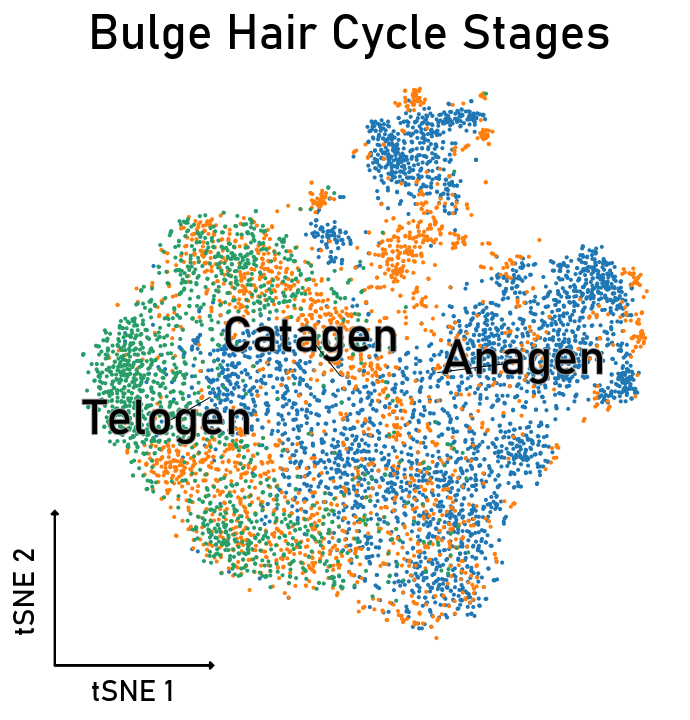

In [122]:
def plot_tsne_with_labels(adata_bulge, color_var, plot_title, legend_fontsize, figsize):
    """
    Create a tSNE plot with non-overlapping labels.
    
    Parameters:
    -----------
    adata_bulge : AnnData
        Annotated data matrix
    color_var : str
        Variable name in adata_bulge.obs for coloring groups
    plot_title : str
        Title for the plot
    figsize : tuple, optional
        Figure size (width, height) in inches
    dpi : int, optional
        Figure resolution
        
    Returns:
    --------
    matplotlib.axes.Axes
        The plot axes
    """
    with plt.rc_context({"figure.figsize": figsize, "figure.frameon": False}):
        # Create base tSNE plot
        ax = sc.pl.tsne(adata_bulge,
                        color=[color_var],
                        show=False,
                        frameon=True)
        
        # Remove spines
        for spine in ax.spines.values():
            spine.set_visible(False)
            
        # Set title and labels
        ax.set_title(plot_title, fontsize=25)
        ax.set_xlabel('tSNE 1', fontsize=15)
        ax.set_ylabel('tSNE 2', fontsize=15)
        ax.xaxis.set_label_coords(0.17, 0.03)
        ax.yaxis.set_label_coords(0.03, 0.17)
        ax.get_legend().remove()

        
        # Get axis limits
        xmin, xmax = ax.get_xlim()
        ymin, ymax = ax.get_ylim()
        
        # Add arrows
        arrow_props = dict(head_width=2, head_length=1, fc='k', ec='k')
        ax.arrow(xmin, ymin, 
                (xmax-xmin)/4, 0,
                **arrow_props)
        ax.arrow(xmin, ymin,
                0, (ymax-ymin)/4,
                **arrow_props)
        
        # Generate and adjust labels
        texts = []
        for group in adata_bulge.obs[color_var].unique():
            mask = adata_bulge.obs[color_var] == group
            x = adata_bulge.obsm['X_tsne'][mask, 0].mean()
            y = adata_bulge.obsm['X_tsne'][mask, 1].mean()
            text = ax.text(x, y, str(group),
                         fontsize=legend_fontsize,
                         path_effects=[pe.withStroke(linewidth=1, foreground="darkgray")],
                         ha='center',
                         va='center')
            texts.append(text)
        
        # Adjust text positions to avoid overlap
        adjust_text(texts,
                   expand_points=(1.2, 1.2),
                   force_points=(0.5, 0.5),
                   arrowprops=dict(arrowstyle='-', color='black', lw=0.5))
        
        return ax

# Usage:
ax = plot_tsne_with_labels(adata_bulge, color_var="diseaseStatus", plot_title = "Bulge Hair Cycle Stages", legend_fontsize = 25, figsize = (6,6))
plt.savefig(os.path.join(output_dir, 'Bulge_HairCycleStages.png'), bbox_inches='tight')

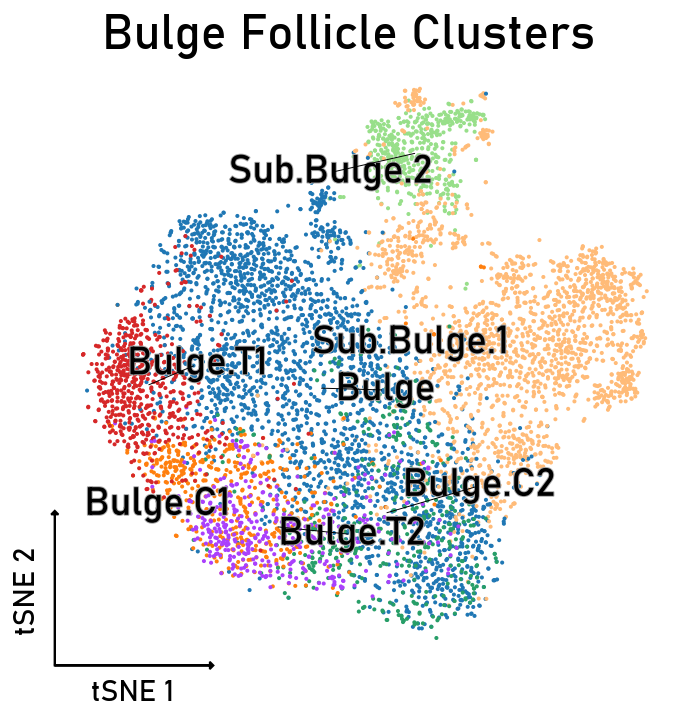

In [15]:
ax = plot_tsne_with_labels(adata_bulge, color_var="FineClust", plot_title = "Bulge Follicle Clusters", legend_fontsize = 20, figsize = (6,6))
plt.savefig(os.path.join(output_dir, 'Bulge_Clusters.png'), bbox_inches='tight')

In [22]:
sc.pp.neighbors(adata_bulge)
sc.tl.paga(adata_bulge, groups = "FineClust")

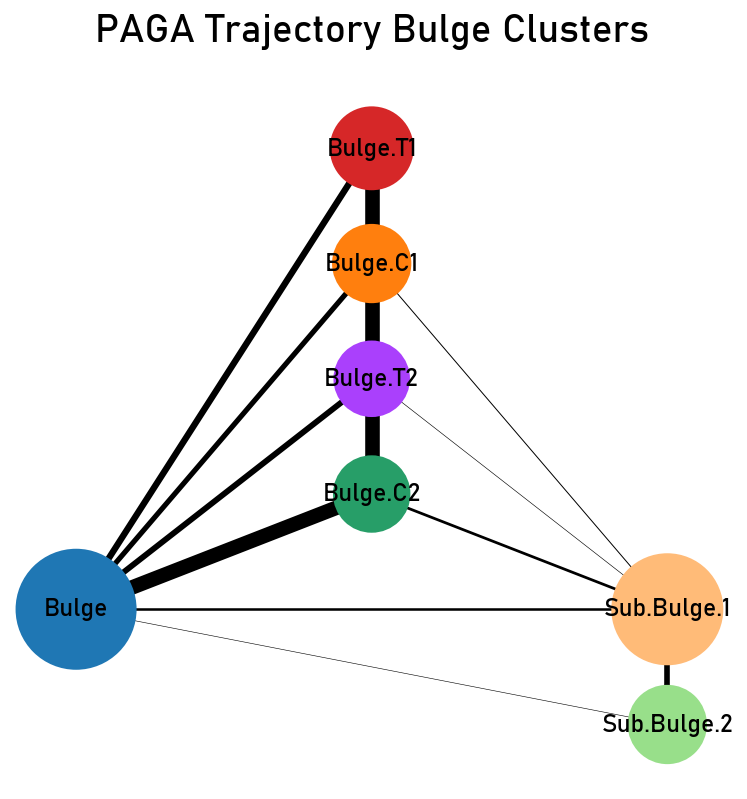

In [23]:
plt.rcParams['figure.figsize'] = [6, 6]

axs = sc.pl.paga(adata_bulge, 
                node_size_power=0.5,
                node_size_scale=10,
                layout='rt',
                root = 3,
                frameon = False,
                save=False,
                show=False,
                title = "PAGA Trajectory Bulge Clusters"
                )

axs.set_title("PAGA Trajectory Bulge Clusters", fontsize = 20, y=1.05)
plt.savefig(os.path.join(output_dir, 'Bulge_PAGATrajectories.png'), bbox_inches='tight')

In [24]:
sc.tl.diffmap(adata_bulge)
sc.tl.dpt(adata_bulge, n_branchings=0, n_dcs=10)

/home/uvictor/miniconda3/envs/cellrank-palantir/lib/python3.12/site-packages/seaborn/matrix.py:1124: UserWarning: ``square=True`` ignored in clustermap
  warnings.warn(msg)



Top 5 genes for Bulge:
JUN: score=28.52, log2FC=2.46
IER2: score=28.27, log2FC=3.13
FOS: score=25.43, log2FC=2.76
PLCB1: score=25.10, log2FC=2.91
DUSP1: score=23.63, log2FC=1.95

Top 5 genes for Bulge.C1:
PARD3B: score=24.00, log2FC=4.39
PIK3C2G: score=23.72, log2FC=3.67
BOC: score=21.95, log2FC=3.40
ISM1: score=20.46, log2FC=3.23
AHNAK2: score=19.81, log2FC=3.56

Top 5 genes for Bulge.C2:
SVIL: score=18.13, log2FC=3.05
ADGRL3: score=17.22, log2FC=2.81
SYNE2: score=16.60, log2FC=1.80
ENSG00000289901: score=16.15, log2FC=1.80
MACF1: score=15.36, log2FC=1.70

Top 5 genes for Bulge.T1:
CXCL14: score=31.30, log2FC=4.24
EEF1A1: score=29.18, log2FC=3.09
FAU: score=28.28, log2FC=4.75
S100A6: score=28.27, log2FC=4.68
B2M: score=28.03, log2FC=4.11

Top 5 genes for Bulge.T2:
DDX17: score=21.60, log2FC=2.88
DST: score=20.98, log2FC=2.18
PIK3C2G: score=20.53, log2FC=3.38
ADGRL3: score=20.12, log2FC=3.49
PARD3B: score=19.95, log2FC=3.90

Top 5 genes for Sub.Bulge.1:
CD44: score=50.55, log2FC=4.83


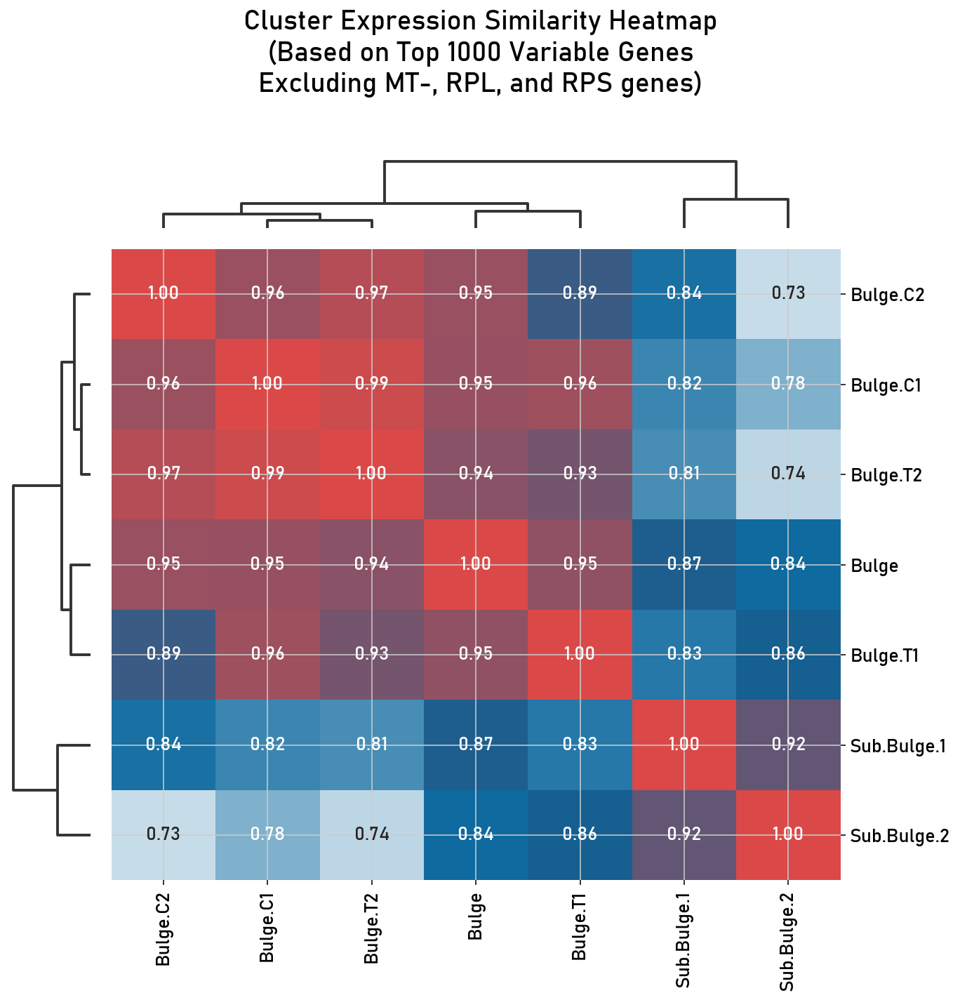

In [29]:
import matplotlib.pyplot as plt

def filter_genes(adata, blacklist_patterns=['MT-', 'RPL', 'RPS']):
    """
    Create a boolean mask for genes to keep (not matching blacklist patterns).
    
    Parameters:
    adata: AnnData object
    blacklist_patterns: list of patterns to exclude
    
    Returns:
    keep_genes: boolean mask for genes to keep
    """
    gene_names = adata.var_names.str.upper()
    keep_genes = np.ones(len(gene_names), dtype=bool)
    
    for pattern in blacklist_patterns:
        keep_genes &= ~gene_names.str.startswith(pattern.upper())
    
    return keep_genes

def calculate_gene_expression_similarity(adata, clusters_to_keep, n_top_genes=1000):
    """
    Calculate similarity between clusters based on mean expression of top variable genes,
    excluding mitochondrial and ribosomal genes.
    
    Parameters:
    adata: AnnData object containing the single-cell data
    clusters_to_keep: list of cluster names to analyze
    n_top_genes: number of top variable genes to consider
    
    Returns:
    similarity_matrix: pandas DataFrame containing pairwise similarities
    top_genes: list of selected highly variable genes
    """
    # Create a copy of adata to avoid modifying the original
    adata_filtered = adata.copy()
    
    # Filter out blacklisted genes
    keep_genes = filter_genes(adata_filtered)
    adata_filtered = adata_filtered[:, keep_genes]
    
    # Calculate highly variable genes on filtered data
    if 'highly_variable' not in adata_filtered.var:
        sc.pp.highly_variable_genes(adata_filtered, n_top_genes=n_top_genes, flavor='seurat')
    
    # Get the top variable genes
    top_genes = adata_filtered.var_names[adata_filtered.var.highly_variable][:n_top_genes].tolist()
    
    # Calculate mean expression for each cluster
    cluster_means = {}
    for cluster in clusters_to_keep:
        # Get cells belonging to this cluster
        cluster_cells = adata_filtered[adata_filtered.obs['FineClust'] == cluster]
        # Calculate mean expression of top variable genes
        cluster_means[cluster] = cluster_cells[:, top_genes].X.mean(axis=0)
        
        # Convert sparse matrix to dense if necessary
        if sp.sparse.issparse(cluster_means[cluster]):
            cluster_means[cluster] = cluster_means[cluster].toarray().flatten()
    
    # Create matrix of mean expressions
    expression_matrix = np.vstack([cluster_means[cluster] for cluster in clusters_to_keep])
    
    # Calculate correlation matrix
    correlation_matrix = np.corrcoef(expression_matrix)
    
    # Convert to similarity matrix (scale from 0 to 1)
    similarity_matrix = (correlation_matrix + 1) / 2
    
    # Convert to DataFrame
    similarity_df = pd.DataFrame(
        similarity_matrix,
        index=clusters_to_keep,
        columns=clusters_to_keep
    )
    
    return similarity_df, top_genes

def plot_expression_similarity_heatmap(similarity_df, figsize=(12, 10), vmin=0.7, vmax=1.0):
    """
    Create a heatmap visualization of the expression-based similarity matrix
    with a focused color scale from 0.7 to 1.0.
    
    Parameters:
    similarity_df: pandas DataFrame containing pairwise similarities
    figsize: tuple specifying figure size
    vmin: minimum value for color scale (default: 0.7)
    vmax: maximum value for color scale (default: 1.0)
    """
    # Create custom colormap that will emphasize differences in the 0.85-1.0 range
    g = sns.clustermap(
        similarity_df,
        annot=True,          # Show values in cells
        fmt='.2f',           # Format to 2 decimal places for better precision
        cmap="custom_wbr",      # Use custom_btr
        square=True,         # Make cells square
        vmin=vmin,           # Minimum value set to 0.7
        vmax=vmax,           # Maximum value set to 1.0
        dendrogram_ratio=0.1,
        tree_kws={'linewidth': 2},
        row_colors=None,     # Remove the row color key
        colors_ratio=0,
    )

    g.cax.set_visible(False)
    
    # Add title
    g.fig.suptitle('Cluster Expression Similarity Heatmap\n(Based on Top 1000 Variable Genes\nExcluding MT-, RPL, and RPS genes)', 
                   y=1.02, 
                   fontsize=20)
    
    plt.tight_layout()
    
    return g.fig

def analyze_cluster_genes(adata, clusters_to_keep, top_genes, n_genes_display=10):
    """
    Analyze and display the top differentially expressed genes between clusters.
    
    Parameters:
    adata: AnnData object
    clusters_to_keep: list of cluster names
    top_genes: list of highly variable genes used in similarity analysis
    n_genes_display: number of top genes to display for each cluster
    """
    # Create a copy with filtered genes
    adata_filtered = adata[:, filter_genes(adata)].copy()
    
    results = []
    
    for cluster in clusters_to_keep:
        # Perform differential expression analysis
        sc.tl.rank_genes_groups(
            adata_filtered,
            groupby='FineClust',
            groups=[cluster],
            reference='rest',
            method='wilcoxon'
        )
        
        # Get top genes for this cluster
        top_cluster_genes = pd.DataFrame(
            sc.get.rank_genes_groups_df(adata_filtered, group=cluster)
            .head(n_genes_display)
        )
        
        results.append({
            'cluster': cluster,
            'top_genes': top_cluster_genes['names'].tolist(),
            'scores': top_cluster_genes['scores'].tolist(),
            'log2fc': top_cluster_genes['logfoldchanges'].tolist()
        })
    
    return results

# Assuming you have your AnnData object as adata_bulge
clusters_to_keep = ['Bulge', 'Bulge.C1', 'Bulge.C2', 'Bulge.T1', 
                    'Bulge.T2', 'Sub.Bulge.1', 'Sub.Bulge.2']

# Calculate similarities based on filtered gene expression
similarity_matrix, top_genes = calculate_gene_expression_similarity(
    adata_bulge, 
    clusters_to_keep,
    n_top_genes=1000
)

# Create and display heatmap
plot_expression_similarity_heatmap(similarity_matrix)

plt.savefig(os.path.join(output_dir, 'Bulge_SimilarityMatrix.png'), bbox_inches='tight')

# Analyze top differential genes
gene_analysis = analyze_cluster_genes(
    adata_bulge, 
    clusters_to_keep, 
    top_genes,
    n_genes_display=200
)

# Display results
for result in gene_analysis:
    print(f"\nTop 5 genes for {result['cluster']}:")
    for gene, score, log2fc in zip(result['top_genes'][:5], 
                                  result['scores'][:5], 
                                  result['log2fc'][:5]):
        print(f"{gene}: score={score:.2f}, log2FC={log2fc:.2f}")


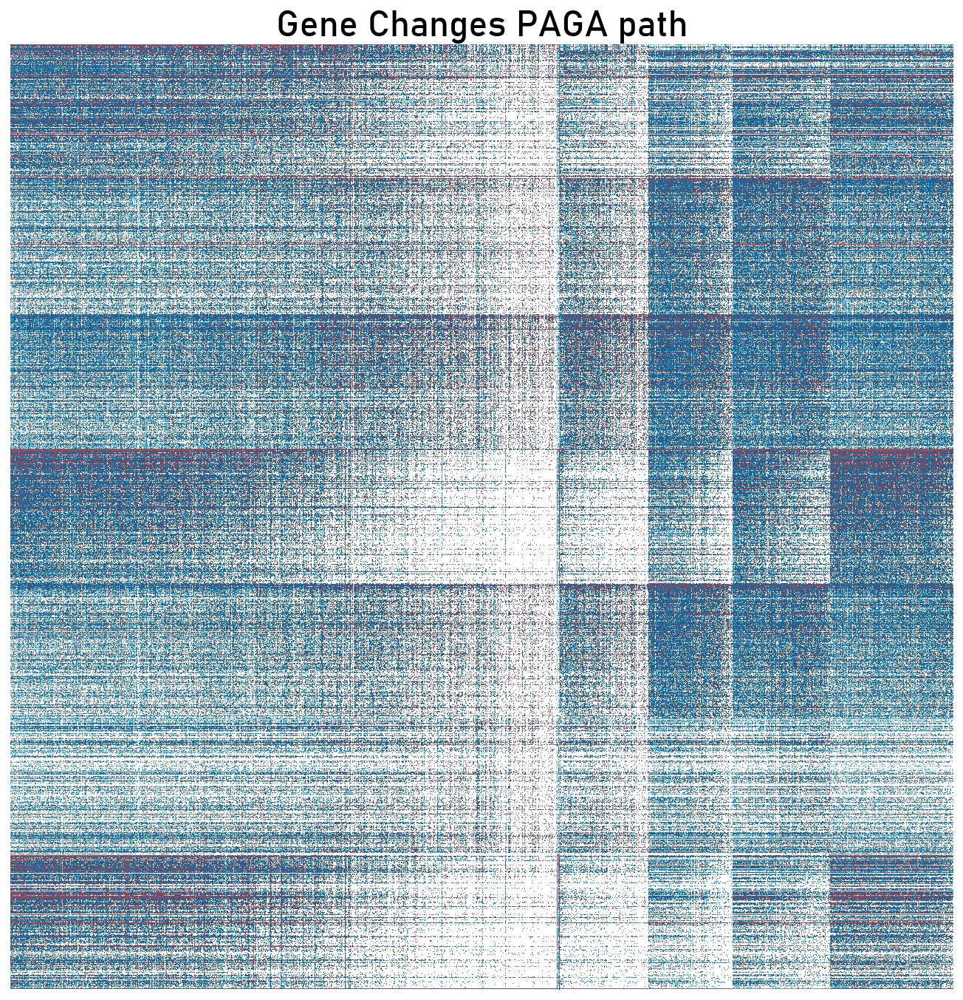

In [30]:
all_top_genes = []
for cluster_data in gene_analysis:
    all_top_genes.extend(cluster_data['top_genes'])
unique_top_genes = list(dict.fromkeys(all_top_genes))

# Adjust figure size to better fit the large number of genes
plt.rcParams['figure.figsize'] = [12, 12]

# Main plot
sc.pl.paga_path(
    adata_bulge,
    nodes=["Bulge", "Bulge.C2", "Bulge.T2", "Bulge.C1", "Bulge.T1"],
    keys=all_top_genes, 
    groups_key='FineClust',
    use_raw=True,
    normalize_to_zero_one=True,
    show_node_names=False,  # Show node names
    show_yticks=False,  # Show y-ticks for gene axis
    show_colorbar=False,
    color_map = "custom_wbr",
    show=True,
    title="Gene Changes PAGA path",
    title_fontsize=25,
    save = True
    
)

In [106]:
clusters_to_keep = ['Bulge', 'Bulge.C1', 'Bulge.C2', 'Bulge.T1', 'Bulge.T2', 'Sub.Bulge.1', 'Sub.Bulge.2']

adata_filtered = adata.copy()

keep_genes = filter_genes(adata_filtered)
adata_filtered = adata_filtered[:, keep_genes]

adata_bulge_core = adata_filtered[adata_filtered.obs['FineClust'].isin(clusters_to_keep)].copy()


sc.tl.dendrogram(adata_bulge_core, cor_method='spearman', groupby = "FineClust")
sc.tl.rank_genes_groups(adata_bulge_core, groupby = "FineClust")

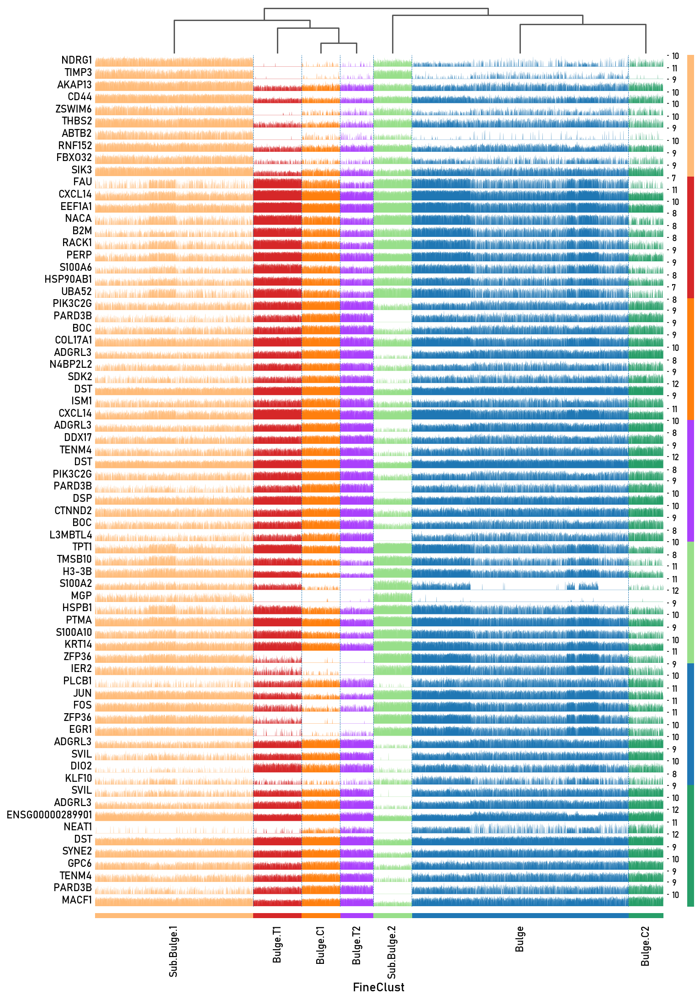

In [108]:
plt.rcParams['figure.figsize'] = [9, 12]

ax = sc.pl.rank_genes_groups_tracksplot(adata_bulge_core,
                                   show = False,
                                   min_logfoldchange = 1.2,
                                   n_genes = 10
                                  )

plt.savefig(os.path.join(output_dir, 'Gene_Signatures_Bulge.png'), bbox_inches='tight')

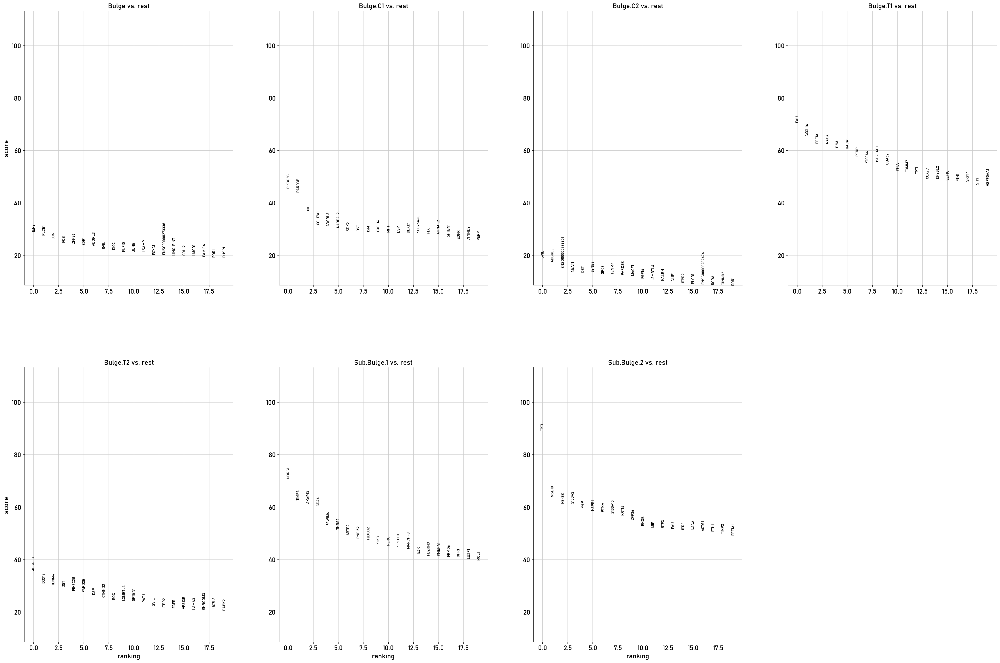

In [109]:
sc.pl.rank_genes_groups(adata_bulge_core, n_genes=20)

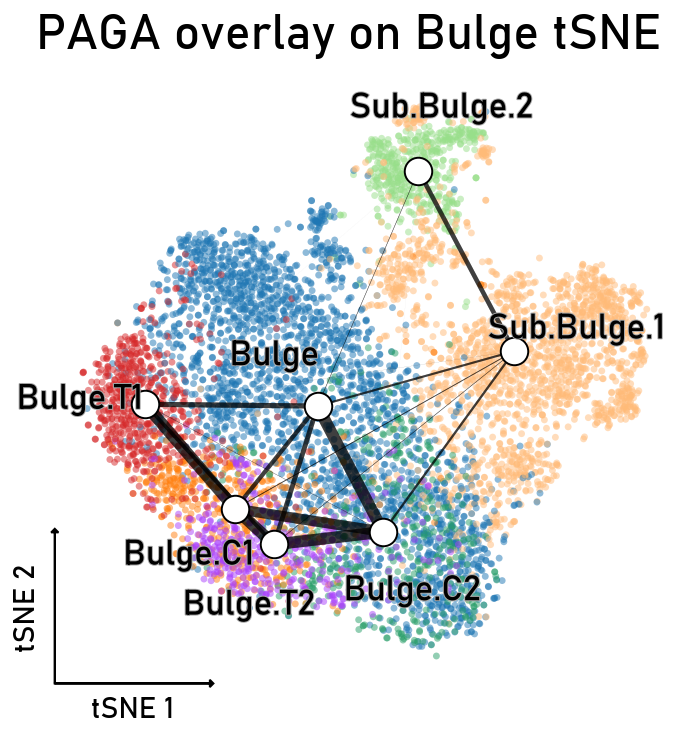

In [110]:
def plot_paga_on_tsne(adata, color_var="FineClust", plot_title='PAGA overlay on tSNE', 
                      save_fig=False, figsize=(6, 6), legend_fontsize=18):
    """
    Plot PAGA graph on top of t-SNE embedding with enhanced styling
    
    Parameters
    ----------
    adata : AnnData
        Annotated data matrix with computed PAGA and t-SNE
    color_var : str, optional (default: "FineClust")
        Variable to use for coloring groups
    plot_title : str, optional (default: 'PAGA overlay on tSNE')
        Title for the plot
    save_fig : bool, optional (default: False)
        If True, save figure to file
    figsize : tuple, optional (default: (6, 6))
        Figure size
    legend_fontsize : int, optional (default: 12)
        Font size for group labels
        
    Returns
    -------
    matplotlib.axes.Axes
        The axes object containing the plot
    """
    # Make sure PAGA and t-SNE have been computed
    if 'paga' not in adata.uns:
        raise ValueError("PAGA has not been computed. Run sc.tl.paga() first.")
    if 'X_tsne' not in adata.obsm:
        raise ValueError("t-SNE has not been computed. Run sc.tl.tsne() first.")
    
    # Create figure
    fig, ax = plt.subplots(figsize=figsize)
    
    # Plot t-SNE points colored by groups
    sc.pl.tsne(adata, color=color_var, size=50, alpha=0.5, 
               show=False, title='', ax=ax, legend_loc=None)
    
    # Get PAGA positions as average positions of cells in groups
    pos = np.zeros((len(adata.obs[color_var].cat.categories), 2))
    for i, cat in enumerate(adata.obs[color_var].cat.categories):
        mask = adata.obs[color_var] == cat
        pos[i] = np.mean(adata.obsm['X_tsne'][mask], axis=0)
    
    # Plot PAGA connections
    connectivities = adata.uns['paga']['connectivities'].tocsr()
    for i in range(connectivities.shape[0]):
        for j in range(connectivities.shape[1]):
            if connectivities[i, j] > 0:
                plt.plot([pos[i, 0], pos[j, 0]], 
                        [pos[i, 1], pos[j, 1]],
                        '-', color='black', 
                        linewidth=connectivities[i, j] * 6,
                        alpha=0.5)
    
    # Plot PAGA node positions
    plt.scatter(pos[:, 0], pos[:, 1], s=200, c='white', edgecolor='black', zorder=3)
    
    # Remove spines
    for spine in ax.spines.values():
        spine.set_visible(False)
        
    # Set title and labels
    ax.set_title(plot_title, fontsize=25, pad = 15)
    ax.set_xlabel('tSNE 1', fontsize=15)
    ax.set_ylabel('tSNE 2', fontsize=15)
    ax.xaxis.set_label_coords(0.17, 0.03)
    ax.yaxis.set_label_coords(0.03, 0.17)
    
    # Get axis limits
    xmin, xmax = ax.get_xlim()
    ymin, ymax = ax.get_ylim()
    
    # Add arrows
    arrow_props = dict(head_width=2, head_length=1, fc='k', ec='k')
    ax.arrow(xmin, ymin, 
            (xmax-xmin)/4, 0,
            **arrow_props)
    ax.arrow(xmin, ymin,
            0, (ymax-ymin)/4,
            **arrow_props)
    
    # Calculate center of all points
    center = np.mean(pos, axis=0)

    # Generate and adjust labels
    texts = []
    for i, cat in enumerate(adata.obs[color_var].cat.categories):
        x = pos[i, 0]
        y = pos[i, 1]
        
        # Calculate vector from center to point
        vec = np.array([x - center[0], y - center[1]])
        # Normalize vector and multiply by offset distance
        offset_distance = 18  # Adjust this value to move labels further/closer
        if np.any(vec):  # Avoid division by zero
            vec = vec / np.sqrt(np.sum(vec**2)) * offset_distance
        
        # Apply offset to position
        text = ax.text(x + vec[0], y + vec[1], str(cat),
                      fontsize=legend_fontsize,
                      path_effects=[pe.withStroke(linewidth=1, foreground="darkgray")],
                      ha='center',
                      va='center')
        texts.append(text)
    
    if save_fig:
        plt.savefig('PAGA_on_TSNE.png', bbox_inches='tight')
        
    return ax


# Assuming you have an AnnData object 'adata_bulge':
sc.tl.paga(adata_bulge, groups="FineClust")

ax = plot_paga_on_tsne(adata_bulge, 
                       color_var="FineClust",
                       plot_title="PAGA overlay on Bulge tSNE",
                       )

plt.savefig(os.path.join(output_dir, 'BulgePAGA_Overlay.png'), bbox_inches='tight')

plt.show()


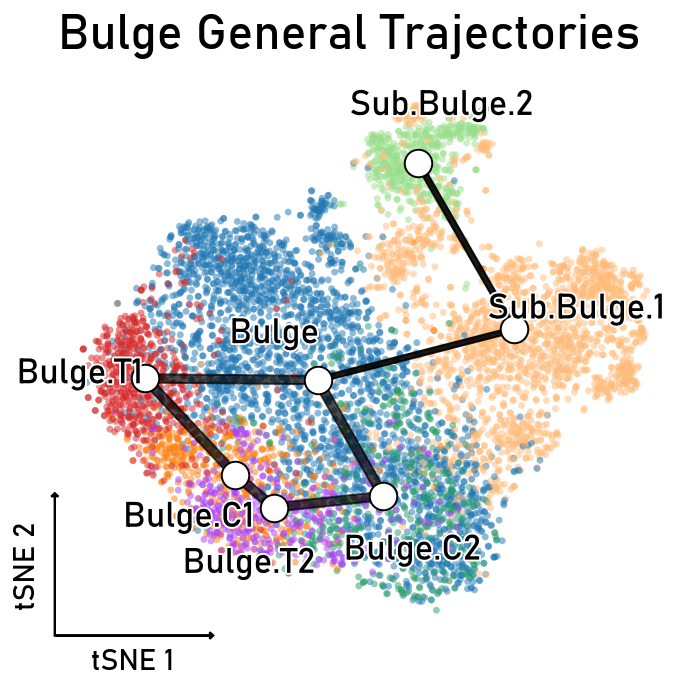

In [111]:
import matplotlib.patheffects as pe

def plot_trajectories(adata, plot_title='Cell Type Trajectories', 
                     save_fig=False, figsize=(6, 6), legend_fontsize=18):
    """
    Plot cell trajectories with cell type coloring and straight arrows
    """
    # Create figure with adjusted layout
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(111)
    plt.subplots_adjust(top=0.85)
    
    # Plot t-SNE points colored by cell type
    sc.pl.tsne(adata, color='FineClust', size=50, alpha=0.5, 
               show=False, title='', ax=ax, legend_loc=None)
    
    # Define the trajectories
    trajectory1 = ['Bulge.T1', 'Bulge', 'Bulge.C2', 'Bulge.T2', 'Bulge.C1', 'Bulge.T1']
    trajectory2 = ['Bulge', 'Sub.Bulge.1', 'Sub.Bulge.2']
    
    # Get positions for each cell type
    pos = {}
    for cat in adata.obs['FineClust'].cat.categories:
        mask = adata.obs['FineClust'] == cat
        pos[cat] = np.mean(adata.obsm['X_tsne'][mask], axis=0)
    
    # Draw first trajectory
    for i in range(len(trajectory1)-1):
        start = pos[trajectory1[i]]
        end = pos[trajectory1[i+1]]
        # Draw arrow
        ax.arrow(start[0], start[1],
                end[0] - start[0], end[1] - start[1],
                head_width=2, head_length=3,
                width=2.5,
                color='black',
                length_includes_head=True,
                alpha=0.7,
                zorder=4)
    
    # Draw second trajectory
    for i in range(len(trajectory2)-1):
        start = pos[trajectory2[i]]
        end = pos[trajectory2[i+1]]
        # Draw arrow
        ax.arrow(start[0], start[1],
                end[0] - start[0], end[1] - start[1],
                head_width=4, head_length=3,
                width=1.5,
                color='black',
                length_includes_head=True,
                alpha=0.9,
                zorder=4)
    
    # Plot node positions
    for cat, position in pos.items():
        ax.scatter(position[0], position[1], s=200, c='white', 
                  edgecolor='black', zorder=5)
    
    # Calculate center of all points for label offset
    positions = np.array(list(pos.values()))
    center = np.mean(positions, axis=0)
    
    # Add offset labels
    texts = []
    for cat, position in pos.items():
        x, y = position
        
        # Calculate vector from center to point
        vec = np.array([x - center[0], y - center[1]])
        # Normalize vector and multiply by offset distance
        offset_distance = 18
        if np.any(vec):  # Avoid division by zero
            vec = vec / np.sqrt(np.sum(vec**2)) * offset_distance
        
        # Apply offset to position
        text = ax.text(x + vec[0], y + vec[1], str(cat),
                      fontsize=legend_fontsize,
                      path_effects=[pe.withStroke(linewidth=2, foreground="white")],
                      ha='center',
                      va='center',
                      weight='bold',
                      zorder=6)
        texts.append(text)
    
    # Remove spines
    for spine in ax.spines.values():
        spine.set_visible(False)
        
    # Set title and labels
    ax.set_title(plot_title, fontsize=25, pad = 15)
    ax.set_xlabel('tSNE 1', fontsize=15)
    ax.set_ylabel('tSNE 2', fontsize=15)
    ax.xaxis.set_label_coords(0.17, 0.03)
    ax.yaxis.set_label_coords(0.03, 0.17)
    
    # Get axis limits
    xmin, xmax = ax.get_xlim()
    ymin, ymax = ax.get_ylim()
    
    # Add arrows
    arrow_props = dict(head_width=2, head_length=1, fc='k', ec='k')
    ax.arrow(xmin, ymin, 
            (xmax-xmin)/4, 0,
            **arrow_props)
    ax.arrow(xmin, ymin,
            0, (ymax-ymin)/4,
            **arrow_props)
    
    if save_fig:
        plt.savefig('CellTrajectoryOverlay.png', bbox_inches='tight')
        
    return ax

ax = plot_trajectories(adata_bulge, plot_title="Bulge General Trajectories", save_fig = True)

plt.savefig(os.path.join(output_dir, 'BulgePAGA_Generalized.png'), bbox_inches='tight')

plt.show()


In [33]:
clusters_to_keep = ['Bulge', 'Bulge.C1', 'Bulge.C2', 'Bulge.T1', 'Bulge.T2']
adata_bulge_sub = adata_bulge[adata_bulge.obs['FineClust'].isin(clusters_to_keep)].copy()

In [34]:
category_map = {
    'Telogen': 2,
    'Anagen': 0,
    'Catagen': 1
}

adata_bulge_sub.obs['diseaseStatus_numeric'] = (
    adata_bulge_sub.obs['diseaseStatus']
    .map(category_map)
    .astype('float')
)

tp = TemporalProblem(adata_bulge_sub)
tp = tp.prepare(time_key="diseaseStatus_numeric")
tp = tp.solve(epsilon=1e-3, tau_a=0.95, scale_cost="mean")
tmk = RealTimeKernel.from_moscot(tp, graph_key = "X_tsne")
print(adata_bulge_sub.obs['diseaseStatus_numeric'].value_counts())
tmk.compute_transition_matrix(adata = adata_bulge_sub, self_transitions="all", conn_weight=0.2, threshold="auto")

INFO     Computing pca with `n_comps=30` for `xy` using `adata.X`                                                  
INFO     Computing pca with `n_comps=30` for `xy` using `adata.X`                                                  
INFO     Solving `2` problems                                                                                      
INFO     Solving problem BirthDeathProblem[stage='prepared', shape=(1573, 1472)].                                  


An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.


INFO     Solving problem BirthDeathProblem[stage='prepared', shape=(1472, 1434)].                                  
diseaseStatus_numeric
0.0    1573
1.0    1472
2.0    1434
Name: count, dtype: int64


  0%|          | 0/2 [00:00<?, ?time pair/s]

RealTimeKernel[n=4479, adata=AnnData object with n_obs × n_vars = 4479 × 38606
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'RNA_snn_res.0.8', 'seurat_clusters', 'pANN_0.25_0.18_1115', 'DF.classifications_0.25_0.18_1115', 'Singlet', 'estConp', 'diseaseStatus', 'S.Score', 'G2M.Score', 'Phase', 'RNA_snn_res.0.2', 'RNA_snn_res.0.4', 'Clusters', 'NamedClust', 'BroadClust', 'SubGroup', 'sample', 'FineClust', 'BigClust', 'pANN_0.25_0.3_254', 'DF.classifications_0.25_0.3_254', 'pANN_0.25_0.27_160', 'DF.classifications_0.25_0.27_160', 'RNA_snn_res.0.5', 'n_counts', 'dpt_pseudotime', 'palantir_pseudotime', 'palantir_entropy', 'diseaseStatus_numeric'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'gene_trends_clusters'
    uns: 'DM_EigenValues', 'FineClust_colors', 'diffmap_evals', 'draw_graph', 'hvg', 'iroot', 'neighbors', 'palantir_waypoints', 'pca', 'umap', 'tsne', 'diseaseStatus_colors', 'paga', 'FineClust_sizes'
    obsm: 'DM_EigenVectors', 'DM

In [35]:
adata_bulge_sub

AnnData object with n_obs × n_vars = 4479 × 38606
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'RNA_snn_res.0.8', 'seurat_clusters', 'pANN_0.25_0.18_1115', 'DF.classifications_0.25_0.18_1115', 'Singlet', 'estConp', 'diseaseStatus', 'S.Score', 'G2M.Score', 'Phase', 'RNA_snn_res.0.2', 'RNA_snn_res.0.4', 'Clusters', 'NamedClust', 'BroadClust', 'SubGroup', 'sample', 'FineClust', 'BigClust', 'pANN_0.25_0.3_254', 'DF.classifications_0.25_0.3_254', 'pANN_0.25_0.27_160', 'DF.classifications_0.25_0.27_160', 'RNA_snn_res.0.5', 'n_counts', 'dpt_pseudotime', 'palantir_pseudotime', 'palantir_entropy', 'diseaseStatus_numeric'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'gene_trends_clusters'
    uns: 'DM_EigenValues', 'FineClust_colors', 'diffmap_evals', 'draw_graph', 'hvg', 'iroot', 'neighbors', 'palantir_waypoints', 'pca', 'umap', 'tsne', 'diseaseStatus_colors', 'paga', 'FineClust_sizes'
    obsm: 'DM_EigenVectors', 'DM_EigenVectors_multiscaled', '

  0%|          | 0/100 [00:00<?, ?sim/s]

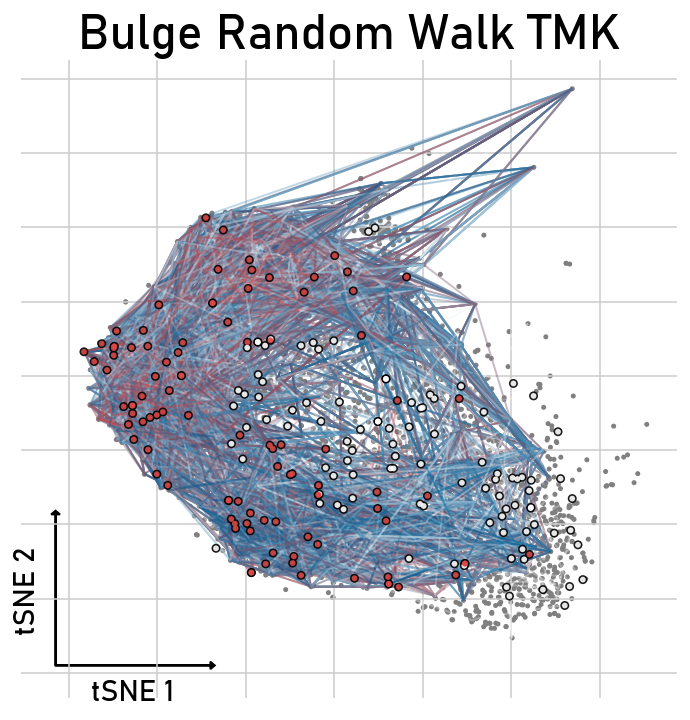

In [36]:
def plot_random_walk_tsne(adata_bulge_sub, plot_title, figsize):
    """
    Create a tSNE plot with random walk TMK problem
    """
    # Call plot_random_walks
    tmk.plot_random_walks(
        max_iter=500,
        start_ixs={"diseaseStatus_numeric": 0.0},
        basis="tsne",
        seed=0,
        figsize=figsize,
        frameon=True,
        cmap="custom_wbr",
        xlabel="tSNE 1",
        ylabel="tSNE 2",
        title=plot_title,
        fontsize=20
    )
    
    # Get current axis
    ax = plt.gca()
    
    # Remove spines
    for spine in ax.spines.values():
        spine.set_visible(False)
        
    # Set title and labels
    ax.set_title(plot_title, fontsize=25)
    ax.set_xlabel('tSNE 1', fontsize=15)
    ax.set_ylabel('tSNE 2', fontsize=15)
    ax.xaxis.set_label_coords(0.17, 0.03)
    ax.yaxis.set_label_coords(0.03, 0.17)
    
    # Get axis limits
    xmin, xmax = ax.get_xlim()
    ymin, ymax = ax.get_ylim()
    
    # Add arrows
    arrow_props = dict(head_width=2, head_length=1, fc='k', ec='k')
    ax.arrow(xmin, ymin, 
            (xmax-xmin)/4, 0,
            **arrow_props)
    ax.arrow(xmin, ymin,
            0, (ymax-ymin)/4,
            **arrow_props)
            
    return ax

# Create the plot
ax = plot_random_walk_tsne(adata_bulge_sub, 
                          plot_title="Bulge Random Walk TMK", 
                          figsize=(6,6))

plt.savefig(os.path.join(output_dir, 'BulgeRandom_TMK.png'), bbox_inches='tight')

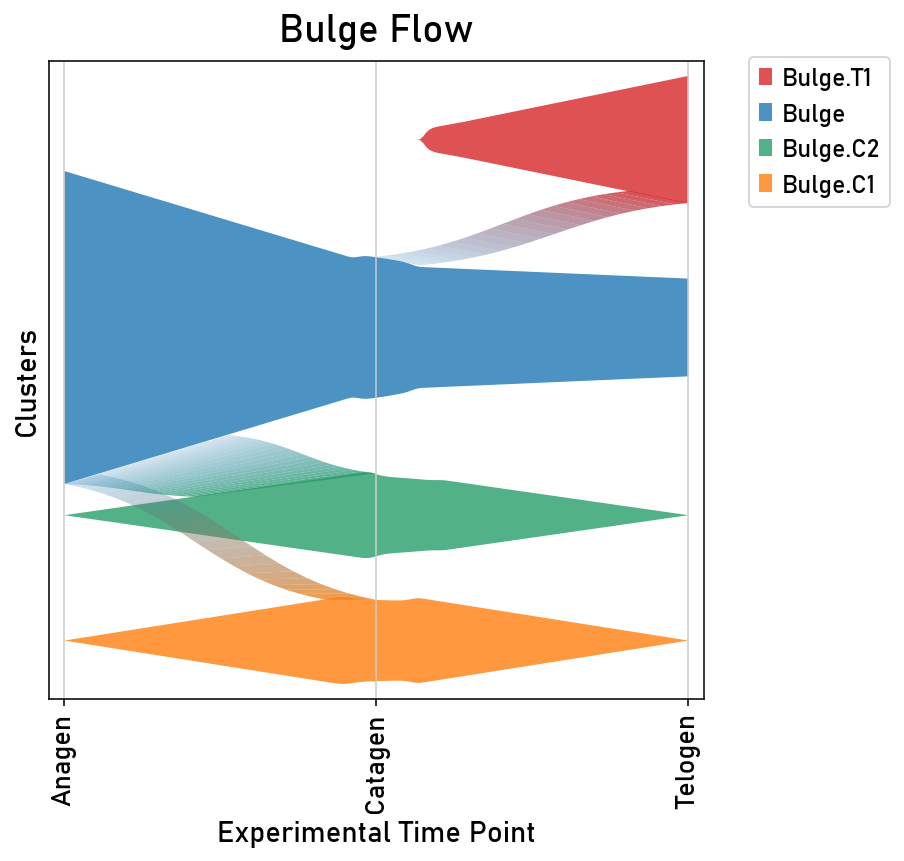

In [37]:
plt.rcParams['figure.figsize'] = [6, 6]

ax = tmk.plot_single_flow(
    cluster_key="FineClust",
    time_key="diseaseStatus_numeric",
    cluster="Bulge",
    xticks_step_size=1,
    show=False,
    clusters=["Bulge", "Bulge.T1", "Bulge.T2", "Bulge.C1", "Bulge.C2", "Sub.Bulge.1", "Sub.Bulge.2"],
)

ax.set_title("Bulge Flow", fontsize=20, pad = 10)
ax.set_xlabel('Experimental Time Point', fontsize=15)
ax.set_xticklabels(['Anagen', 'Catagen', 'Telogen'])
ax.set_ylabel('Clusters', fontsize=15)

_ = ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

plt.savefig(os.path.join(output_dir, 'BulgeFlow.png'), bbox_inches='tight')

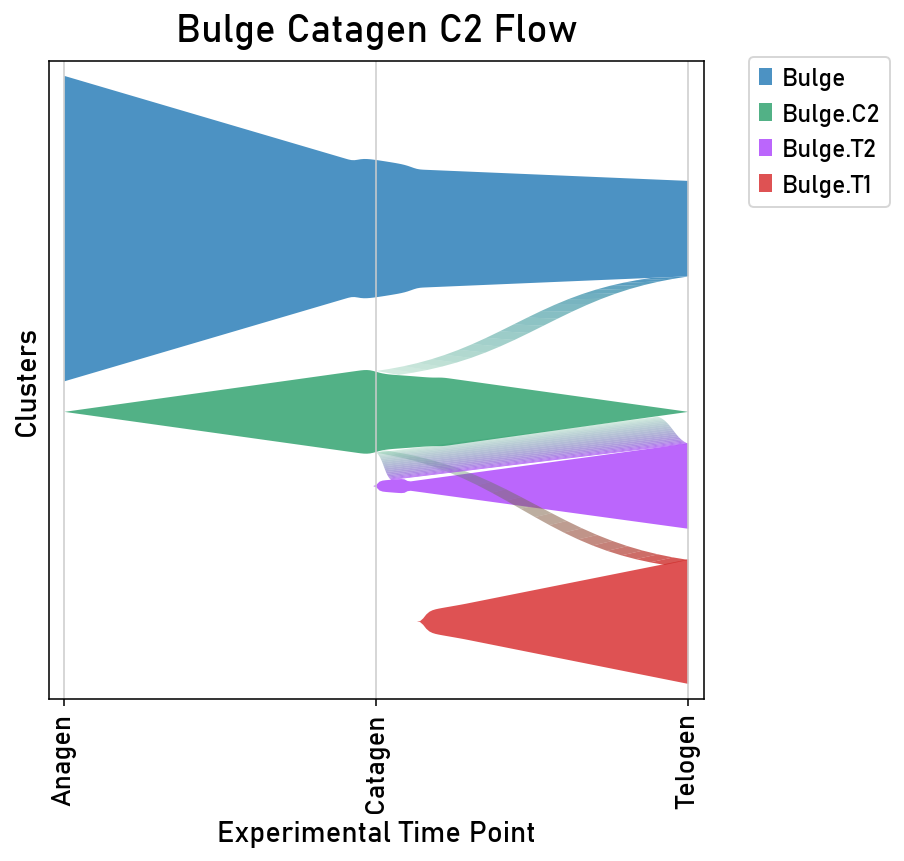

In [38]:
plt.rcParams['figure.figsize'] = [6, 6]

ax = tmk.plot_single_flow(
    cluster_key="FineClust",
    time_key="diseaseStatus_numeric",
    cluster="Bulge.C2",
    xticks_step_size=1,
    show=False,
    clusters=["Bulge", "Bulge.T1", "Bulge.T2", "Bulge.C1", "Bulge.C2", "Sub.Bulge.1", "Sub.Bulge.2"],
)

ax.set_title("Bulge Catagen C2 Flow", fontsize=20, pad = 10)
ax.set_xlabel('Experimental Time Point', fontsize=15)
ax.set_xticklabels(['Anagen', 'Catagen', 'Telogen'])
ax.set_ylabel('Clusters', fontsize=15)

_ = ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

plt.savefig(os.path.join(output_dir, 'BulgeFlowC2.png'), bbox_inches='tight')

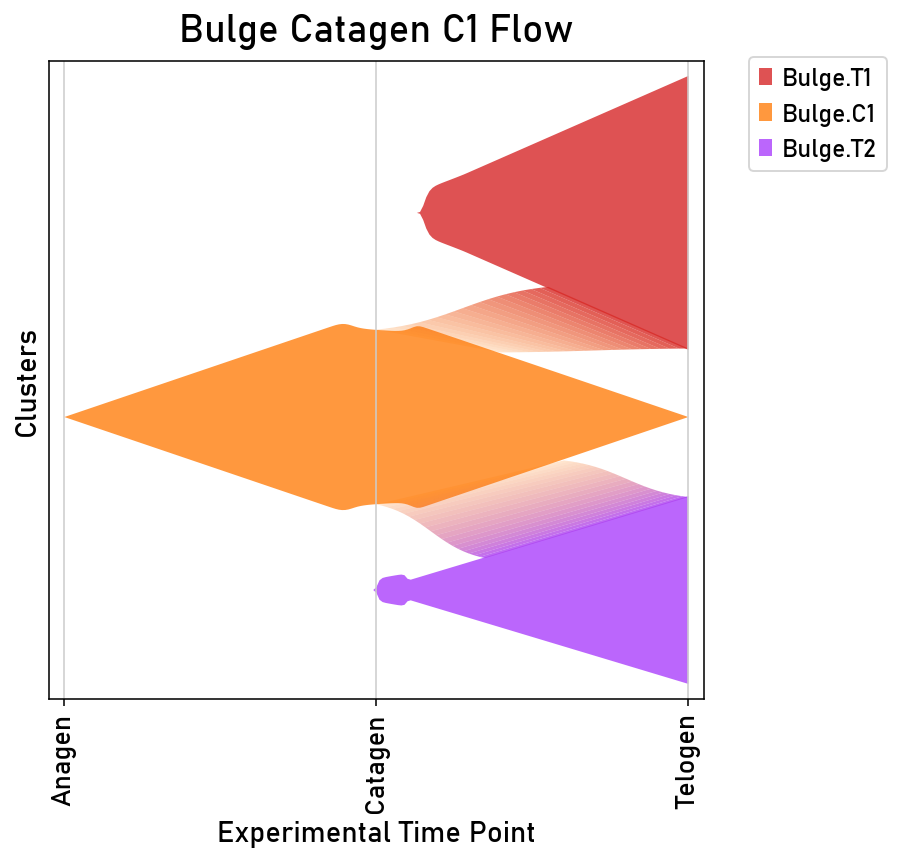

In [39]:
plt.rcParams['figure.figsize'] = [6, 6]

ax = tmk.plot_single_flow(
    cluster_key="FineClust",
    time_key="diseaseStatus_numeric",
    cluster="Bulge.C1",
    xticks_step_size=1,
    show=False,
    clusters=["Bulge", "Bulge.T1", "Bulge.T2", "Bulge.C1", "Bulge.C2", "Sub.Bulge.1", "Sub.Bulge.2"],
)

ax.set_title("Bulge Catagen C1 Flow", fontsize=20, pad = 10)
ax.set_xlabel('Experimental Time Point', fontsize=15)
ax.set_xticklabels(['Anagen', 'Catagen', 'Telogen'])
ax.set_ylabel('Clusters', fontsize=15)

_ = ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

plt.savefig(os.path.join(output_dir, 'BulgeFlowC1.png'), bbox_inches='tight')

In [42]:
imputed_X = palantir.utils.run_magic_imputation(adata_bulge_sub)

In [48]:
g = cr.estimators.GPCCA(tmk)

In [85]:
g.fit(cluster_key="FineClust", n_states=[11, 15])

GPCCA[kernel=RealTimeKernel[n=4479], initial_states=None, terminal_states=None]

/home/uvictor/miniconda3/envs/cellrank-palantir/lib/python3.12/site-packages/scvelo/plotting/scatter.py:656: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

/home/uvictor/miniconda3/envs/cellrank-palantir/lib/python3.12/site-packages/scvelo/plotting/scatter.py:656: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



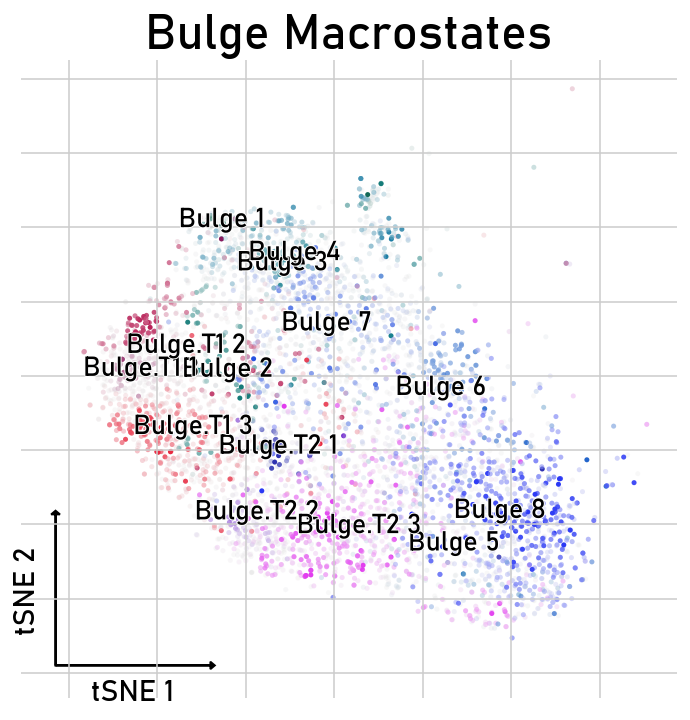

In [86]:
plt.rcParams['figure.figsize'] = [6, 6]

def plot_macrostates_tsne(adata, plot_title, figsize):
    """
    Create a tSNE plot for Macrostates
    """
    # Call plot_random_walks
    g.plot_macrostates(which="all", discrete=False, basis='tsne', show = False)

    adata.obs['macrostates'] = g.macrostates.copy()
    
    # Get current axis
    ax = plt.gca()
    
    # Remove spines
    for spine in ax.spines.values():
        spine.set_visible(False)
        
    # Set title and labels
    ax.set_title(plot_title, fontsize=25)
    ax.set_xlabel('tSNE 1', fontsize=15)
    ax.set_ylabel('tSNE 2', fontsize=15)
    ax.xaxis.set_label_coords(0.17, 0.03)
    ax.yaxis.set_label_coords(0.03, 0.17)
    
    # Get axis limits
    xmin, xmax = ax.get_xlim()
    ymin, ymax = ax.get_ylim()
    
    # Add arrows
    arrow_props = dict(head_width=2, head_length=1, fc='k', ec='k')
    ax.arrow(xmin, ymin, 
            (xmax-xmin)/4, 0,
            **arrow_props)
    ax.arrow(xmin, ymin,
            0, (ymax-ymin)/4,
            **arrow_props)
            
    return ax

# Create the plot
ax = plot_macrostates_tsne(adata_bulge_sub, 
                          plot_title="Bulge Macrostates", 
                          figsize=(6,6))

plt.savefig(os.path.join(output_dir, 'Bulge_Macrostates.png'), bbox_inches='tight')

In [87]:
g.set_initial_states(states=["Bulge_6"])
g.set_terminal_states(states=["Bulge_1"])

GPCCA[kernel=RealTimeKernel[n=4479], initial_states=['Bulge_6'], terminal_states=['Bulge_1']]

In [88]:
g.compute_fate_probabilities()
g.compute_eigendecomposition()

bulge_drivers = g.compute_lineage_drivers(lineages="Bulge_1")

  0%|          | 0/1 [00:00<?, ?/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


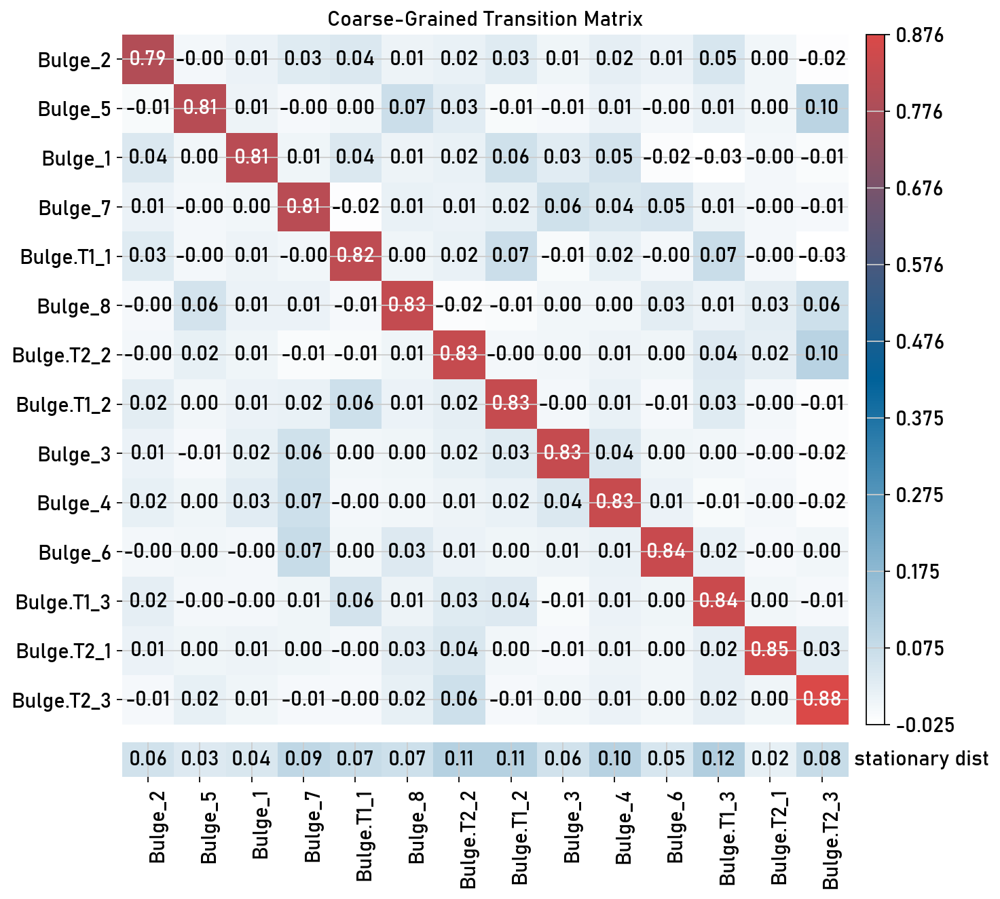

In [90]:
g.plot_coarse_T(title="Coarse-Grained Transition Matrix",
                figsize=(9,9),
                xtick_rotation = 90,
                cmap = "custom_wbr",
                save = os.path.join(output_dir, "Bulge_CoarseTMatrix.png")
)

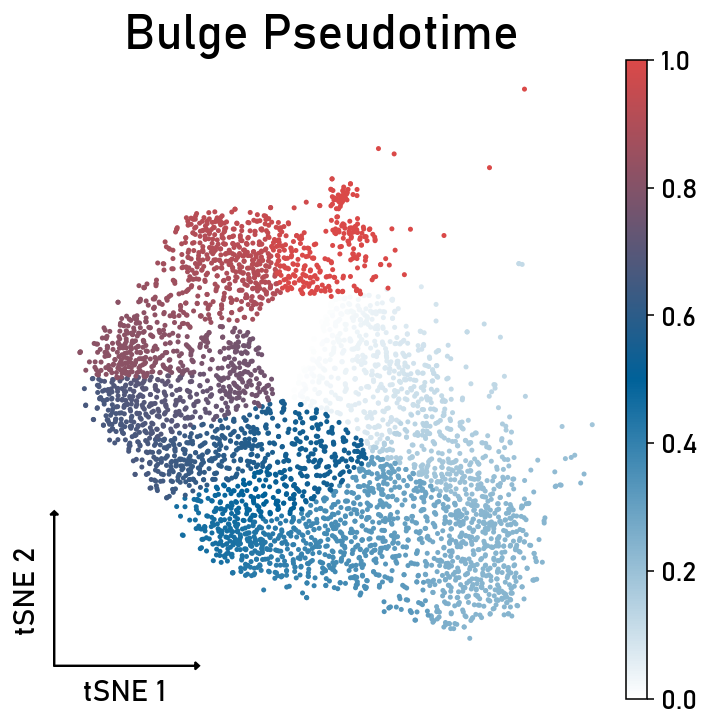

In [131]:
def create_custom_trajectory(
    adata: sc.AnnData,
    cluster_order: dict,
    cluster_col: str = 'macrostates',
    basis: str = 'X_tsne',
    sigma: float = 0.1
) -> sc.AnnData:
    """
    Create pseudotime trajectory using cluster centroids as waypoints and apply to all cells.
    
    Parameters
    ----------
    adata : AnnData
        Annotated data matrix
    cluster_order : dict
        Dictionary mapping cluster names to their order
    cluster_col : str
        Column name in adata.obs containing cluster assignments
    basis : str
        Key in adata.obsm for coordinates
    sigma : float
        Smoothing factor for distance weighting
    """
    import numpy as np
    from scipy.spatial.distance import cdist
    
    # Check if basis exists in obsm
    if basis not in adata.obsm:
        raise KeyError(f"'{basis}' not found in adata.obsm. Available bases: {list(adata.obsm.keys())}")
    
    # Get ordered cluster names and their coordinates
    ordered_clusters = [k for k, v in sorted(cluster_order.items(), key=lambda x: x[1])]
    coordinates = adata.obsm[basis]
    
    # Calculate cluster centroids
    centroids = {}
    for cluster in ordered_clusters:
        mask = adata.obs[cluster_col] == cluster
        if mask.any():  # Only calculate if cluster exists
            centroids[cluster] = coordinates[mask].mean(axis=0)
    
    # Create ordered list of centroids
    ordered_centroids = np.vstack([centroids[cluster] for cluster in ordered_clusters])
    
    # Calculate cumulative distances along the path between centroids
    centroid_distances = np.cumsum([0] + [
        np.linalg.norm(ordered_centroids[i] - ordered_centroids[i-1]) 
        for i in range(1, len(ordered_centroids))
    ])
    centroid_positions = centroid_distances / centroid_distances[-1]
    
    # Function to calculate distance to path segments
    def point_to_segment_distance(point, start, end):
        """Calculate distance from point to line segment"""
        segment = end - start
        length_sq = np.sum(segment ** 2)
        if length_sq == 0:
            return np.linalg.norm(point - start)
        
        t = max(0, min(1, np.sum((point - start) * segment) / length_sq))
        projection = start + t * segment
        return np.linalg.norm(point - projection), t, projection
    
    # Calculate pseudotime for all cells
    pseudotime = np.zeros(len(adata))
    
    for i in range(len(coordinates)):
        point = coordinates[i]
        
        # Calculate distances to all path segments
        min_dist = float('inf')
        best_time = 0
        
        for j in range(len(ordered_centroids) - 1):
            start = ordered_centroids[j]
            end = ordered_centroids[j + 1]
            
            dist, t, _ = point_to_segment_distance(point, start, end)
            
            if dist < min_dist:
                min_dist = dist
                # Interpolate pseudotime between segment endpoints
                best_time = centroid_positions[j] * (1-t) + centroid_positions[j+1] * t
        
        pseudotime[i] = best_time
    
    # Add results to adata
    adata.obs['trajectory_order'] = adata.obs[cluster_col].map(cluster_order)
    adata.obs['custom_pseudotime'] = pseudotime
    
    # Store centroid positions for reference
    adata.uns['trajectory_centroids'] = {
        'coordinates': ordered_centroids,
        'pseudotime': centroid_positions
    }
    
    return adata

# Use it with your data:
cluster_order = {
    'Bulge_7': 1,
    'Bulge_6': 2, 
    'Bulge_8': 3,    # First in trajectory
    'Bulge_5': 4,
    'Bulge.T2_3': 5,
    'Bulge.T2_2': 6,
    'Bulge.T2_1': 7,
    'Bulge.T1_3': 8,
    'Bulge_2': 9,
    'Bulge.T1_2': 10,
    'Bulge_1': 11,
    'Bulge_4': 12
    # Last in trajectory
}

# Apply the function
adata_bulge_sub = create_custom_trajectory(
    adata_bulge_sub,
    cluster_order,
    cluster_col='macrostates',
    basis='X_tsne'
)

def plot_embedding_pseudotime(adata_bulge, color_var, plot_title, figsize=(6,6)):
    """
    Create a tSNE plot colored by pseudotime values.
    
    Parameters:
    -----------
    adata_bulge : AnnData
        Annotated data matrix
    color_var : str
        Variable name in adata_bulge.obs for pseudotime values
    plot_title : str
        Title for the plot
    figsize : tuple, optional
        Figure size (width, height) in inches
        
    Returns:
    --------
    matplotlib.axes.Axes
        The plot axes
    """
    with plt.rc_context({"figure.figsize": figsize, "figure.frameon": False}):
        # Create base tSNE plot with pseudotime coloring
        ax = sc.pl.embedding(adata_bulge,
                           color=color_var,
                           basis="X_tsne",
                           show=False,
                           frameon=True,
                           cmap='custom_wbr',  # You can change the colormap as needed
                           title=plot_title)
        
        # Remove spines
        for spine in ax.spines.values():
            spine.set_visible(False)
            
        # Set title and labels
        ax.set_title(plot_title, fontsize=25)
        ax.set_xlabel('tSNE 1', fontsize=15)
        ax.set_ylabel('tSNE 2', fontsize=15)
        ax.xaxis.set_label_coords(0.17, 0.03)
        ax.yaxis.set_label_coords(0.03, 0.17)
        
        # Get axis limits
        xmin, xmax = ax.get_xlim()
        ymin, ymax = ax.get_ylim()
        
        # Add arrows
        arrow_props = dict(head_width=2, head_length=1, fc='k', ec='k')
        ax.arrow(xmin, ymin, 
                (xmax-xmin)/4, 0,
                **arrow_props)
        ax.arrow(xmin, ymin,
                0, (ymax-ymin)/4,
                **arrow_props)
        
        return ax

# Usage:
ax = plot_embedding_pseudotime(adata_bulge_sub, 
                             color_var="custom_pseudotime", 
                             plot_title="Bulge Pseudotime")
plt.savefig(os.path.join(output_dir, 'Bulge_Pseudotime.png'), bbox_inches='tight')

In [93]:
model = cr.models.GAMR(adata_bulge_sub, n_knots=15, smoothing_penalty=10)

  0%|          | 0/3000 [00:00<?, ?gene/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: 

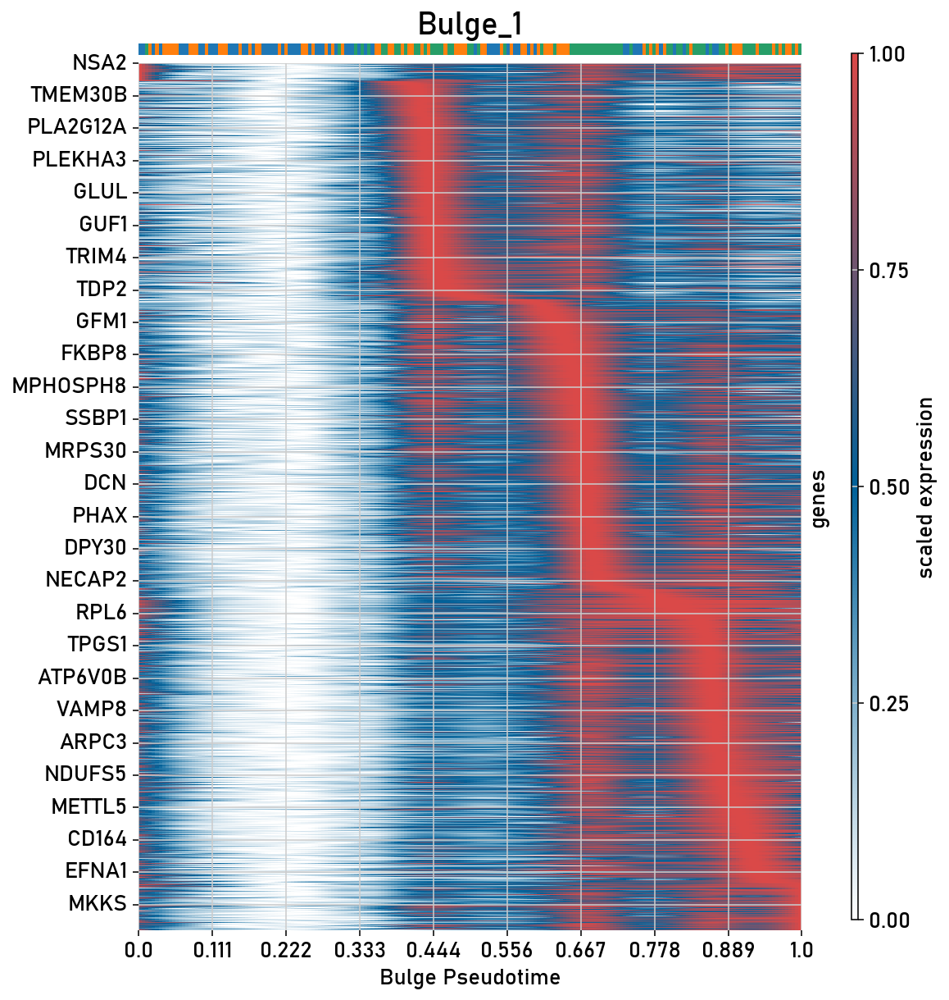

In [95]:
#Plot heatmap driver gene progression
cr.pl.heatmap(
    adata_bulge_sub,
    model=model,
    lineages="Bulge_1",
    cluster_key="diseaseStatus",
    genes=bulge_drivers.head(3000).index,
    time_key="custom_pseudotime",
    fontsize = 20,
    xlabel = "Bulge Pseudotime",
    figsize=(9, 10),
    show_all_genes=False,
    return_figure=False,
    weight_threshold=(1e-3, 1e-3),
    cmap = "custom_wbr",
    save = os.path.join(output_dir, "Bulge_DriverGenePseudotime.png")
)